In [1]:
import os
os.environ['R_HOME'] = '/usr/lib/R'
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from anndata import AnnData
import scanpy as sc
sc.set_figure_params(figsize=(8,8),dpi_save=600)
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['Arial']

In [2]:
import cudf
import seaborn as sns
expr=cudf.read_csv("data/raw_counts.csv",index_col=0)

adata=sc.AnnData(expr.to_pandas().T)
qc=sc.pp.calculate_qc_metrics(adata)[0]
custom_palette = sns.color_palette()

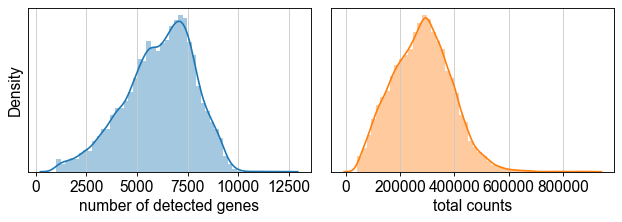

In [3]:
fig, axes = plt.subplots(1, 2,figsize=(8, 3))
sns.distplot(qc.n_genes_by_counts,ax=axes[0])
axes[0].set_xlabel("number of detected genes")
sns.distplot(qc.total_counts,ax=axes[1],color=custom_palette[1])
plt.xlabel("total counts")
plt.ylabel("")
axes[0].set_yticks([])
axes[1].set_yticks([])
plt.ticklabel_format(axis="x",style="sci")
plt.tight_layout()
plt.savefig("figures/QC.svg",dpi=600)

In [4]:
auc=pd.read_csv("scenic/output/auc_mtx_mm10.csv",index_col=0)

In [5]:
ms_data=pd.read_csv("ms_data_auc_mega.csv",index_col=0)
umap=pd.read_csv("UMAP_Glia_auc_mega.csv",index_col=0)

In [6]:
col_devtime=["#FFFF00","#F1E834","#E3D248","#D4BC56","#C5A761","#B69169","#A67C70","#956876","#83547C","#704080","#592C84","#3D1788","#00008B"]

In [7]:
import cudf

In [8]:
fpm=cudf.read_csv("fpm_mega.csv",index_col=0).T

In [9]:
adata=AnnData(fpm.to_pandas(),obsm={'X_umap':umap.values,
                       'X_diffusion':ms_data.values})
devtime=pd.read_csv("devtime.csv",index_col=0)["x"].astype("str").astype("category")
devtime.cat.reorder_categories(["9.5"]+devtime.cat.categories[0:7].tolist()+["P0","P2","P6","P10","Adult"],inplace=True)
adata.obs["devtime"]=devtime

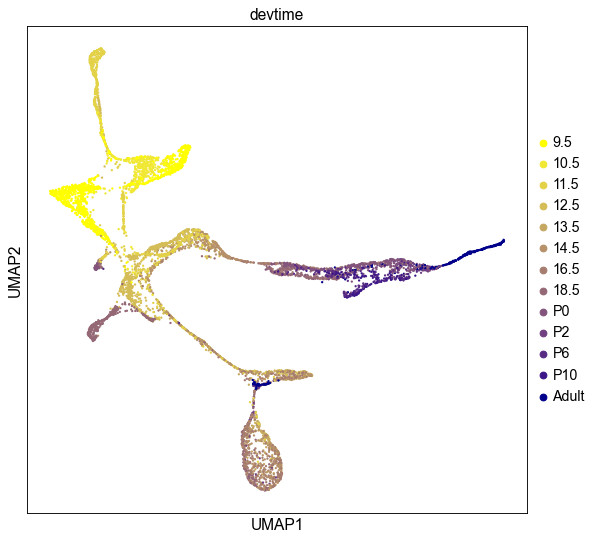

In [10]:
sc.pl.umap(adata,color="devtime",palette=col_devtime)

In [11]:
adata.obs["sel"]=adata.obs.devtime=="9.5"
adata.obs["sel"]=adata.obs["sel"].astype(str).astype("category")

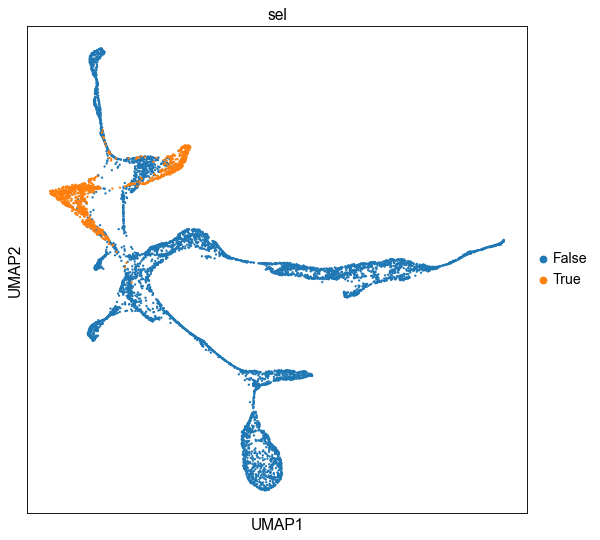

In [12]:
sc.pl.umap(adata,color='sel')

In [13]:
annot_plates=pd.read_table("plates_locations.tab",index_col=0)
adata.obs["plates"]=list(map(lambda x: x.split(":")[0],adata.obs_names))
adata.obs["locations"]=adata.obs["plates"]
for cat in adata.obs["plates"].unique():
    adata.obs.loc[adata.obs["plates"]==cat,"locations"]=annot_plates.loc[cat,"Location - annotation"]
adata.obs["plates"]=adata.obs["plates"].astype("category")
adata.obs["locations"]=adata.obs["locations"].astype("category")

In [14]:
pal=["#aa40fc","#ff7f0e","#17becf","#279e68","#d62728","#90bfe0","#1f77b4","#042f66"]

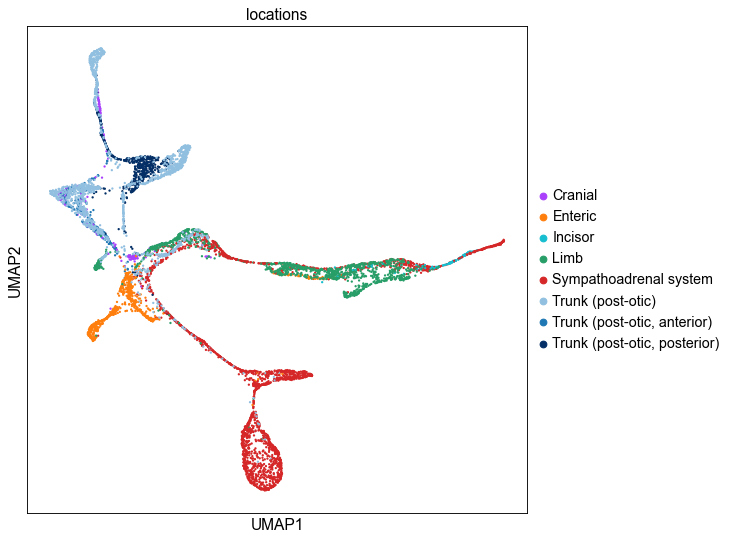

In [15]:
sc.pl.umap(adata,color="locations",palette=pal,save="loc_all.png")

In [16]:
counts_matrix=expr.loc[:,adata.obs_names].to_pandas().T

In [17]:
import scrublet as scr
scrub = scr.Scrublet(counts_matrix)
doublet_scores, predicted_doublets = scrub.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.64
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 27.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.1%
Elapsed time: 16.4 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

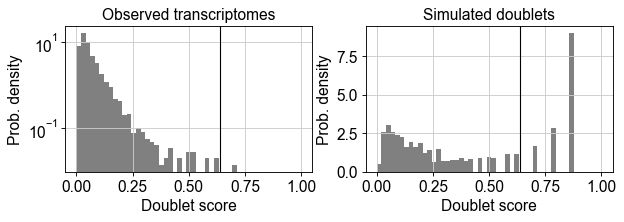

In [18]:
scrub.plot_histogram()

In [19]:
predicted_doublets

array([False, False, False, ..., False, False, False])

In [20]:
adata.obs["doublet_scores"]=doublet_scores
adata.obs["predicted_doublets"]=doublet_scores>0.5
adata.obs["predicted_doublets"]=adata.obs["predicted_doublets"].astype("category")
adata.obs["total_counts"]=qc.loc[adata.obs_names,"total_counts"]
adata.obs["n_genes_by_counts"]=qc.loc[adata.obs_names,"n_genes_by_counts"]

In [21]:
adata.obs.predicted_doublets.value_counts()

False    6965
True       12
Name: predicted_doublets, dtype: int64

In [22]:
sc.set_figure_params()

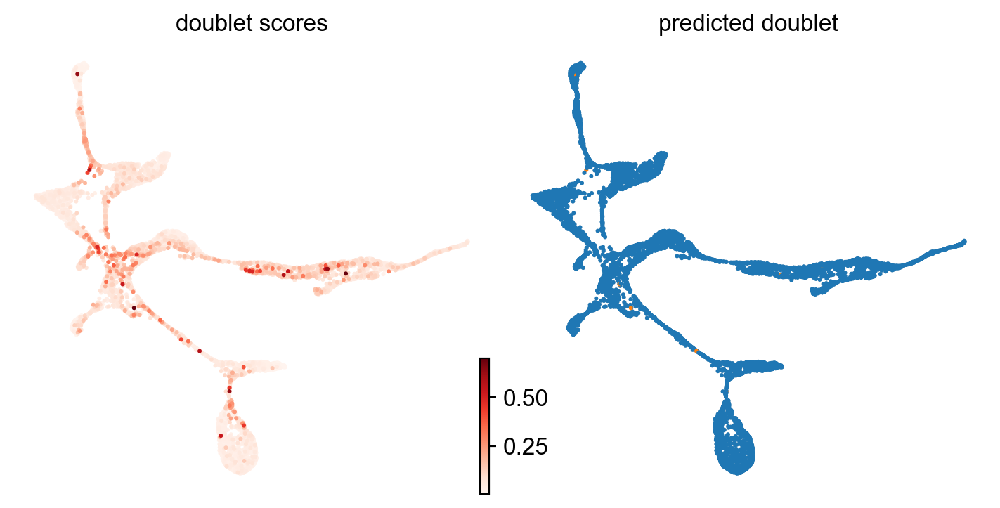

In [23]:
import scvelo as scv
scv.set_figure_params(dpi_save=600,figsize=(3.5,3.5))
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(7,3.5),constrained_layout=True)
scv.pl.umap(adata,color="doublet_scores",cmap="Reds",ax=ax1,show=False)
scv.pl.umap(adata,color="predicted_doublets",groups=["True"],title='predicted doublet',
            legend_loc="none",ax=ax2,show=False)
plt.savefig('figures/QC-scrublet.svg')

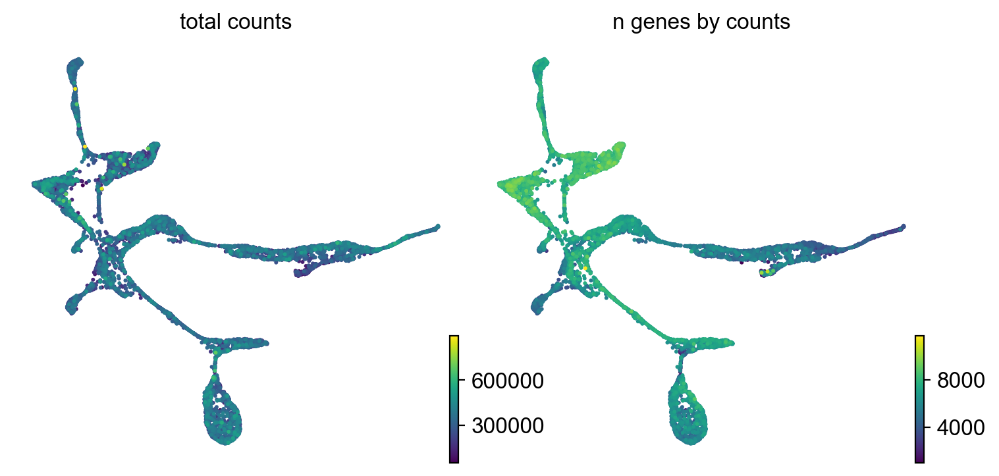

In [24]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(7,3.5),constrained_layout=True)
scv.pl.umap(adata,color="total_counts",cmap="viridis",ax=ax1,show=False,sort_order=True)
scv.pl.umap(adata,color="n_genes_by_counts",cmap="viridis",ax=ax2,show=False,sort_order=True)
plt.savefig('figures/QC-2.svg')

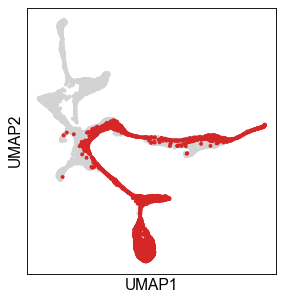

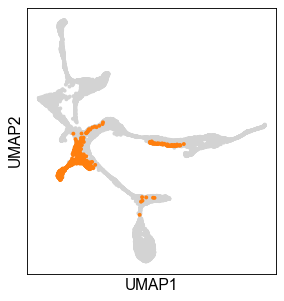

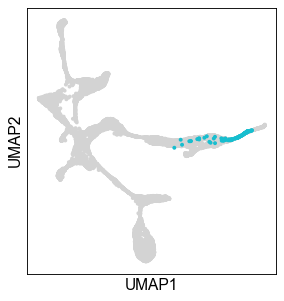

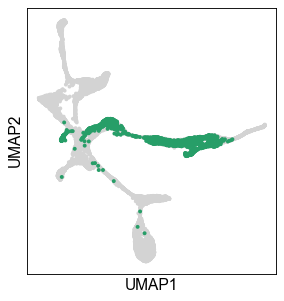

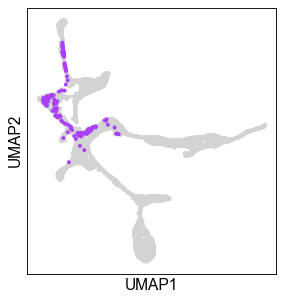

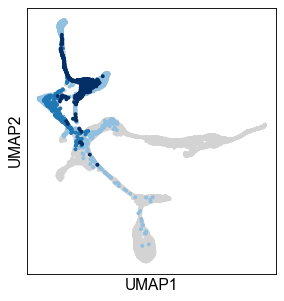

In [24]:
sc.set_figure_params(dpi_save=600,frameon=True)
sc.pl.scatter(adata,basis="umap",color="locations",palette=pal,size=50,groups=["Sympathoadrenal system"],title="",legend_loc="none",save="loc_symp.png")
sc.pl.scatter(adata,basis="umap",color="locations",palette=pal,size=50,groups=["Enteric"],title="",legend_loc="none",save="loc_ent.png")
sc.pl.scatter(adata,basis="umap",color="locations",palette=pal,size=50,groups=["Incisor"],title="",legend_loc="none",save="loc_incisor.png")
sc.pl.scatter(adata,basis="umap",color="locations",palette=pal,size=50,groups=["Limb"],title="",legend_loc="none",save="loc_limb.png")
sc.pl.scatter(adata,basis="umap",color="locations",palette=pal,size=50,groups=["Cranial"],title="",legend_loc="none",save="loc_cranial.png")
sc.pl.scatter(adata,basis="umap",color="locations",palette=pal,size=50,groups=["Trunk (post-otic)","Trunk (post-otic, anterior)","Trunk (post-otic, posterior)"],title="",legend_loc="none",save="loc_trunk.png")

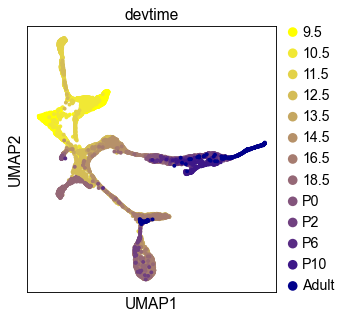

In [25]:
sc.pl.scatter(adata,basis="umap",color="devtime",size=50,palette=col_devtime,save="devtime.png")

In [26]:
for devtime in adata.obs.devtime.cat.categories:
    sc.pl.scatter(adata,basis="umap",color="devtime",show=False,
                  title=devtime+": "+str((adata.obs.devtime==devtime).sum()),legend_loc="none",
                  size=50,groups=devtime,palette=col_devtime,save="_devtime_"+devtime+".svg")

... storing 'leiden' as categorical


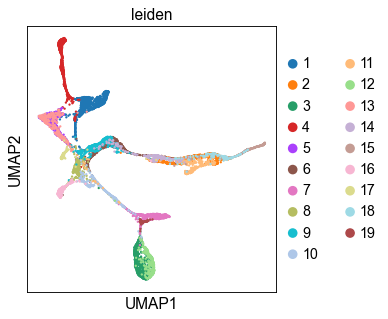

In [27]:
adata.obs["leiden"]=pd.read_csv("leiden.csv")["x"].astype(str).values
sc.pl.scatter(adata,basis="umap",color="leiden")

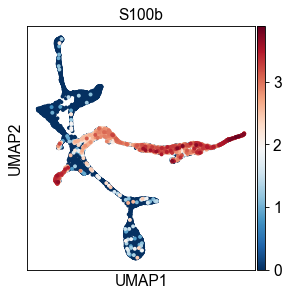

In [28]:
sc.pl.umap(adata,color="S100b",cmap="RdBu_r",size=50,save="_All_S100b.png")

In [29]:
cc_genes=pd.read_table("https://github.com/theislab/scanpy_usage/raw/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt",header=None)[0].str.capitalize()
s_genes = cc_genes[:43]
g2m_genes = cc_genes[43:]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

... storing 'phase' as categorical


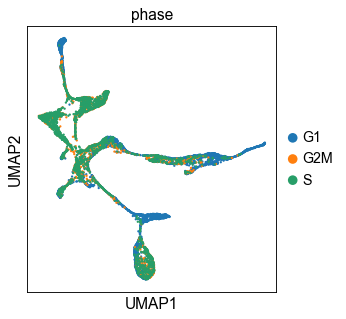

In [30]:
sc.pl.scatter(adata,basis="umap",color="phase",save="cellcycle.png")

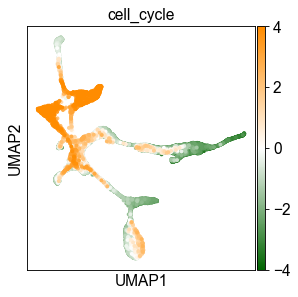

In [31]:
adata.obs["cell_cycle"]=pd.read_csv("aspect_cc.csv",index_col=0).values
from matplotlib.colors import LinearSegmentedColormap
cmap=LinearSegmentedColormap.from_list("aspect",["darkgreen","white","darkorange"])
adata.obsm["X_umap"]=umap.values
sc.pl.umap(adata,color="cell_cycle",size=50,color_map=cmap,vmax=4,vmin=-4,save="_cc_aspect.svg")

In [32]:
from matplotlib.colors import LinearSegmentedColormap
gr="RdBu_r"

In [33]:
adata.obs["NCC"]=pd.DataFrame(adata[:,["Sox9","Wnt1","Snai1","Ets1"]].X).mean(axis=1).values>2
adata.obs["NCC"]=adata.obs["NCC"].astype("category")

for gene in ["Sox9","Wnt1","Snai1","Ets1"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_NCC_"+gene+".png",legend_loc="none",show=False)

adata.obs["Symp"]=pd.DataFrame(adata[:,["Cartpt","Prph","Stmn2","Cplx1"]].X).mean(axis=1).values>2.5
adata.obs["Symp"]=adata.obs["Symp"].astype("category")

for gene in ["Cartpt","Prph","Stmn2","Cplx1"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Symp_"+gene+".png",legend_loc="none",show=False)

adata.obs["ChC"]=pd.DataFrame(adata[:,["Chga","Chgb","Slc18a1","Slc18a2"]].X).mean(axis=1).values>3.5
adata.obs["ChC"]=adata.obs["ChC"].astype("category")

for gene in ["Chga","Chgb","Slc18a1","Slc18a2"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_ChC_"+gene+".png",legend_loc="none",show=False)

adata.obs["Sensory"]=pd.DataFrame(adata[:,["Neurod1","Neurod4","Pou4f1","Neurog1","Prdm12"]].X).mean(axis=1).values>2.5
adata.obs["Sensory"]=adata.obs["Sensory"].astype("category")

for gene in ["Neurod1","Neurod4","Pou4f1","Neurog1","Prdm12"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Sensory_"+gene+".png",legend_loc="none",show=False)

adata.obs["Gut_glia"]=pd.DataFrame(adata[:,["Phox2b","Ctgf","Nfia","Tgfb2","S100b"]].X).mean(axis=1).values>2.6
adata.obs["Gut_glia"]=adata.obs["Gut_glia"].astype("category")

for gene in ["Phox2b","Ctgf","Nfia","Tgfb2","S100b"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Gut_glia_"+gene+".png",legend_loc="none",show=False)

adata.obs["Gut_neuron"]=pd.DataFrame(adata[:,["Ret", "Phox2a", "Tbx3","Elavl4","Hes6"]].X).mean(axis=1).values>3
adata.obs["Gut_neuron"]=adata.obs["Gut_neuron"].astype("category")

for gene in ["Ret", "Phox2a", "Tbx3","Elavl4","Hes6"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Gut_neuron_"+gene+".png",legend_loc="none",show=False)

adata.obs["Melanocyte"]=pd.DataFrame(adata[:,["Dct","Mitf","Pmel","Tyr"]].X).mean(axis=1).values>1.5
adata.obs["Melanocyte"]=adata.obs["Melanocyte"].astype("category")

for gene in ["Dct","Mitf","Pmel","Tyr"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Melanocyte_"+gene+".png",legend_loc="none",show=False)

adata.obs["SC"]=pd.DataFrame(adata[:,["Mpz","Plp1","Fbxo7","Gjc3","Pmp22"]].X).mean(axis=1).values>3
adata.obs["SC"]=adata.obs["SC"].astype("category")

for gene in ["Mpz","Plp1","Fbxo7","Gjc3","Pmp22"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_SC_"+gene+".png",legend_loc="none",show=False)

adata.obs["enFib"]=pd.DataFrame(adata[:,["Lum","Prrx1","Dcn","Fbn1","Pdgfra","Pdgfrb"]].X).mean(axis=1).values>2
adata.obs["enFib"]=adata.obs["enFib"].astype("category")

for gene in ["Lum","Prrx1","Dcn","Fbn1","Pdgfra","Pdgfrb"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_enFib_"+gene+".png",legend_loc="none",show=False)

In [34]:
import palantir
auc=pd.read_csv("scenic/output/auc_mtx_mm10.csv",index_col=0)
dm_res = palantir.utils.run_diffusion_maps(auc,knn=50)
data = pd.DataFrame(adata.X, index=adata.obs_names, columns=adata.var_names)
imp_df = palantir.utils.run_magic_imputation(data, dm_res)
adata.layers["magic"]=imp_df.values

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.


Determing nearest neighbor graph...


In [35]:
genes=['Prss56','Egr2','Npr3','Sema6d','Sema6a','Wif1','Heyl','Hey2','Hbb-y','Plp1','Pmp22','Fabp7','Neurod1','Neurod4','Prdm12','Mpz','Mitf','Dct','Phox2a','Phox2b','Sox10','S100b','Gjc3','Chga','Chgb','Cartpt','Th','Dbh']

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


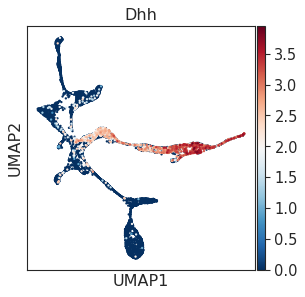

In [36]:
sc.pl.umap(adata,color='Dhh',cmap='RdBu_r')

In [38]:

def plot_marker(g):
    ax=sc.pl.umap(adata,color=g,cmap='RdBu_r',frameon=False,show=False)
    ax.set_box_aspect(aspect=1)
    fig = ax.get_gridspec().figure
    fig.get_axes()[
        np.argwhere(["colorbar" in a.get_label() for a in fig.get_axes()])[0][0]
    ].remove()
    plt.savefig('figures/marker_'+g+'.svg')
    
    ax=sc.pl.umap(adata,color=g,cmap='RdBu_r',layer='magic',frameon=False,show=False)
    ax.set_box_aspect(aspect=1)
    fig = ax.get_gridspec().figure
    fig.get_axes()[
        np.argwhere(["colorbar" in a.get_label() for a in fig.get_axes()])[0][0]
    ].remove()
    plt.savefig('figures/marker_'+g+'_magic.svg')

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

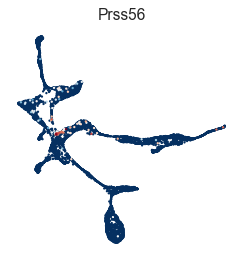

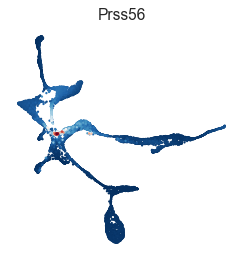

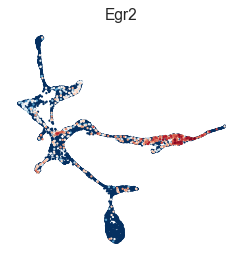

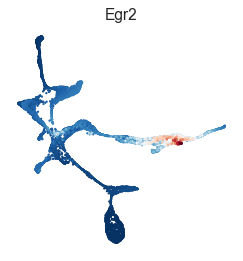

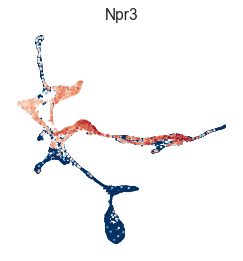

...

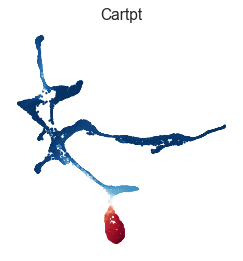

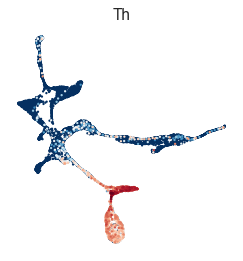

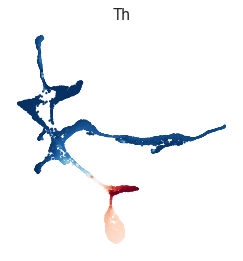

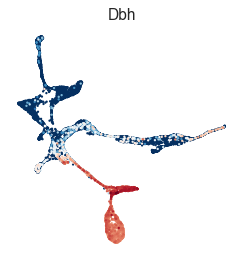

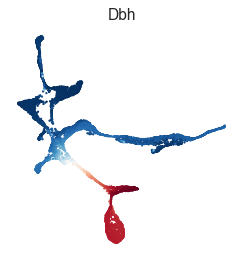

In [39]:
list(map(plot_marker,genes))

In [40]:
pd.DataFrame(adata[:,["Chga","Chgb","Slc18a1","Slc18a2"]].layers["magic"]).mean(axis=1)

0       1.055204
1       2.352948
2       0.534084
3       1.861278
4       0.295123
          ...   
6972    0.082688
6973    0.085301
6974    0.112621
6975    0.094491
6976    0.069631
Length: 6977, dtype: float64

In [41]:
adata.obs["ChC"]=pd.DataFrame(adata[:,["Th","Dbh","Chga","Chgb","Slc18a1","Slc18a2"]].layers["magic"]).mean(axis=1).values>3.5

In [42]:
adata.obs["ChC"]=adata.obs["ChC"].astype("category")

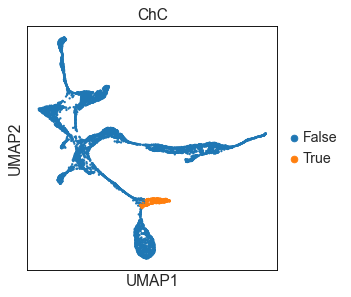

In [43]:
sc.pl.umap(adata,color="ChC")

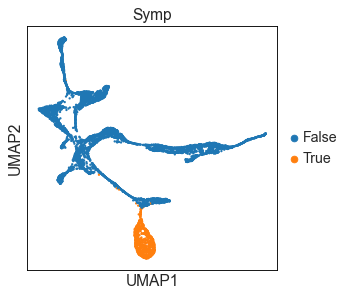

In [44]:
adata.obs["Symp"]=pd.DataFrame(adata[:,["Cartpt","Prph","Mapt","Stmn2","Maoa"]].layers["magic"]).mean(axis=1).values>1.5
adata.obs["Symp"]=adata.obs["Symp"].astype("category")
sc.pl.umap(adata,color="Symp")

In [46]:
adata.obs["NCC"]=pd.DataFrame(adata[:,["Sox9","Wnt1","Snai1","Ets1"]].layers["magic"]).mean(axis=1).values>1.5
adata.obs["NCC"]=adata.obs["NCC"].astype("category")

for gene in ["Sox9","Wnt1","Snai1","Ets1"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_NCC_"+gene+".png",legend_loc="none",show=False)

adata.obs["Symp"]=pd.DataFrame(adata[:,["Cartpt","Prph","Mapt","Maoa","Stmn2"]].layers["magic"]).mean(axis=1).values>1.5
adata.obs["Symp"]=adata.obs["Symp"].astype("category")

for gene in ["Cartpt","Prph","Mapt","Maoa","Stmn2"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Symp_"+gene+".png",legend_loc="none",show=False)

adata.obs["ChC"]=pd.DataFrame(adata[:,["Th","Dbh","Chga","Chgb","Slc18a1","Slc18a2"]].layers["magic"]).mean(axis=1).values>3.5
adata.obs["ChC"]=adata.obs["ChC"].astype("category")

for gene in ["Th","Dbh","Chga","Chgb","Slc18a1","Slc18a2"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_ChC_"+gene+".png",legend_loc="none",show=False)

adata.obs["Sensory"]=pd.DataFrame(adata[:,["Neurod1","Neurod4","Pou4f1","Neurog1","Prdm12"]].layers["magic"]).mean(axis=1).values>2
adata.obs["Sensory_sel"]=adata.obs["Sensory"].astype("category")

for gene in ["Neurod1","Neurod4","Pou4f1","Neurog1"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Sensory_"+gene+".png",legend_loc="none",show=False)

adata.obs["Gut_glia"]=pd.DataFrame(adata[:,["Phox2b","Ctgf","Nfia","Tgfb2","S100b"]].layers["magic"]).mean(axis=1).values>2
adata.obs["Gut_glia"]=adata.obs["Gut_glia"].astype("category")

for gene in ["Phox2b","Ctgf","Nfia","Tgfb2","S100b"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Gut_glia_"+gene+".png",legend_loc="none",show=False)

adata.obs["Gut_neuron"]=pd.DataFrame(adata[:,["Ret", "Phox2a", "Tbx3","Elavl4","Hes6"]].layers["magic"]).mean(axis=1).values>2.5
adata.obs["Gut_neuron"]=adata.obs["Gut_neuron"].astype("category")

for gene in ["Ret", "Phox2a", "Tbx3","Elavl4","Hes6"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Gut_neuron_"+gene+".png",legend_loc="none",show=False)

adata.obs["Melanocyte"]=pd.DataFrame(adata[:,["Dct","Mitf","Pmel","Tyr"]].layers["magic"]).mean(axis=1).values>1
adata.obs["Melanocyte"]=adata.obs["Melanocyte"].astype("category")

for gene in ["Dct","Mitf","Pmel","Tyr"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_Melanocyte_"+gene+".png",legend_loc="none",show=False)

adata.obs["SC"]=pd.DataFrame(adata[:,["Mpz","Plp1","Fbxo7","Gjc3","Pmp22","Dhh","Mal","S100b"]].layers["magic"]).mean(axis=1).values>2.2
adata.obs["SC"]=adata.obs["SC"].astype("category")

for gene in ["Mpz","Plp1","Fbxo7","Gjc3","Pmp22"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_SC_"+gene+".png",legend_loc="none",show=False)

adata.obs["enFib"]=pd.DataFrame(adata[:,["Lum","Prrx1","Dcn","Fbn1","Pdgfra","Pdgfrb"]].layers["magic"]).mean(axis=1).values>1
adata.obs["enFib"]=adata.obs["enFib"].astype("category")

for gene in ["Lum","Prrx1","Dcn","Fbn1","Pdgfra","Pdgfrb"]:
    sc.pl.scatter(adata,basis="umap",color=gene,color_map=gr,save="_enFib_"+gene+".png",legend_loc="none",show=False)

In [47]:
adata.obs["conflict"]=adata.obs[["NCC","Symp","ChC","Sensory","Gut_glia","Gut_neuron","Melanocyte","SC","enFib"]].sum(axis=1)>1

In [48]:
adata.obs.loc[adata.obs[["NCC","Symp","ChC","Sensory","Gut_glia","Gut_neuron","Melanocyte","SC","enFib"]].sum(axis=1)>1,
              ["NCC","Symp","ChC","Sensory","Gut_glia","Gut_neuron","Melanocyte","SC","enFib"]]=False

In [49]:
adata.obs.loc[adata.obs[["NCC","Symp","ChC","Sensory","Gut_glia","Gut_neuron","Melanocyte","SC","enFib"]].sum(axis=1)==2,
              ["NCC","Symp","ChC","Sensory","Gut_glia","Gut_neuron","Melanocyte","SC","enFib"]]=False

annot=adata.obs.loc[:,["NCC","Symp","ChC","Sensory","Gut_glia","Gut_neuron","Melanocyte","SC","enFib"]].apply(lambda x:np.argwhere(x.values),axis=1)
annot=annot[annot.apply(len)==1]
annot=annot.apply(lambda x: np.array(["NCC","Symp","ChC","Sensory","Gut_glia","Gut_neuron","Melanocyte","SC","enFib"])[x][0][0])

In [50]:
adata.obs["assignments"]="none"
adata.obs.loc[annot.index,"assignments"]=annot.values
adata.obs["assignments"]=adata.obs["assignments"].astype("category")

In [51]:
adata.uns["assignments_colors"]=["#ff3b3b","#f500c4","#a1004b","#006b5f","#030ffc","#a0db72","#9e36ff","#ff820d","#11a624","lightgrey"]
sc.pl.scatter(adata,basis="umap",color="assignments",size=50,save="assignments.png",
              groups=['ChC', 'Gut_glia', 'Gut_neuron', 'Melanocyte', 'NCC', 'Sensory', 'Symp','SC','enFib'])

In [52]:
sc.pl.scatter(adata,basis="umap",color="assignments",size=50,save="assignments_nolegend.png",legend_loc="none",
              groups=['ChC', 'Gut_glia', 'Gut_neuron', 'Melanocyte', 'NCC', 'Sensory', 'Symp','SC','enFib'])

In [53]:
adata.obs["Hub"]=(~adata.obs["conflict"]) & (adata.obs["assignments"]=="none")

In [54]:
adata.obs["Hub"]=adata.obs["Hub"].astype("category")

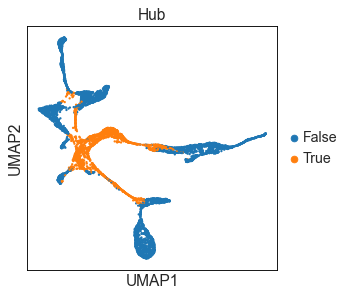

In [55]:
sc.pl.umap(adata,color="Hub")

In [56]:
sc.tl.rank_genes_groups(adata,groupby="Hub",method="wilcoxon")

In [57]:
print("\n".join(sc.get.rank_genes_groups_df(adata,"True",log2fc_min=1)["names"].values[:25].tolist()))

Spon1
Nell2
Cdkn1c
Cthrc1
Rbp1
Ednrb
Dlx1
Ldhb
Serpine2
Id3
Fabp7
Cdh6
Moxd1
Pls3
Dlx2
S100a16
Mef2c
Lmo4
Ckb
Adam12
Gpr17
Celf2
Sntb1
Slitrk6
Gpx8


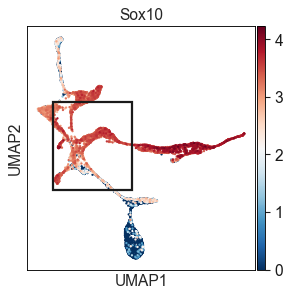

In [58]:
import matplotlib.patches as patches
ax=sc.pl.umap(adata,color="Sox10",cmap="RdBu_r",show=False)
rect = patches.Rectangle((-13,-6),15,16,linewidth=2,edgecolor='k',facecolor='none')
ax.add_patch(rect)
plt.savefig('figures/Sox10_rectangle.png',dpi=600)

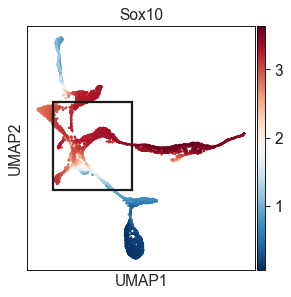

In [59]:
import matplotlib.patches as patches
ax=sc.pl.umap(adata,color="Sox10",cmap="RdBu_r",layer='magic',show=False)
rect = patches.Rectangle((-13,-6),15,16,linewidth=2,edgecolor='k',facecolor='none')
ax.add_patch(rect)
plt.savefig('figures/Sox10_rectangle_magic.png',dpi=600)

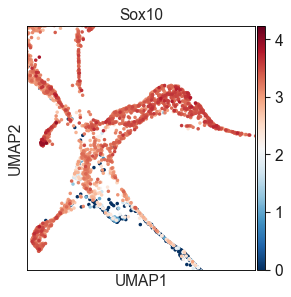

In [60]:
sc.pl.umap(adata,color="Sox10",cmap="RdBu_r",size=40)
plt.xlim([-13,2])
plt.ylim([-6,9])
plt.savefig("figures/HUB_sox10.png",dpi=600)

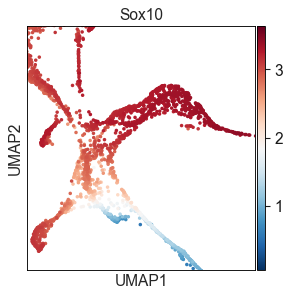

In [61]:
sc.pl.umap(adata,color="Sox10",cmap="RdBu_r",layer='magic',size=40)
plt.xlim([-13,2])
plt.ylim([-6,9])
plt.savefig("figures/HUB_sox10_magic.png",dpi=600)

In [62]:
for g in sc.get.rank_genes_groups_df(adata,"True")["names"].values[:25].tolist():
    sc.pl.umap(adata,color=g,cmap="RdBu_r",save="_HUB_"+g+".png",legend_loc="none",show=False)
    sc.pl.umap(adata,color=g,cmap="RdBu_r",save="_HUB_magic_"+g+".png",layer="magic",legend_loc="none",show=False)

In [63]:
add=['Ascl1','Phox2b','Gjc3','Mpz','S100b','Prdm12','Prss56']
for g in add:
    sc.pl.umap(adata,color=g,cmap="RdBu_r",save="_Add_magic_"+g+".png",layer="magic",legend_loc="none",show=False)

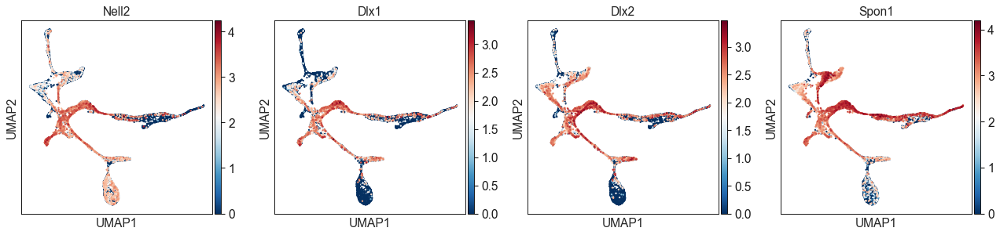

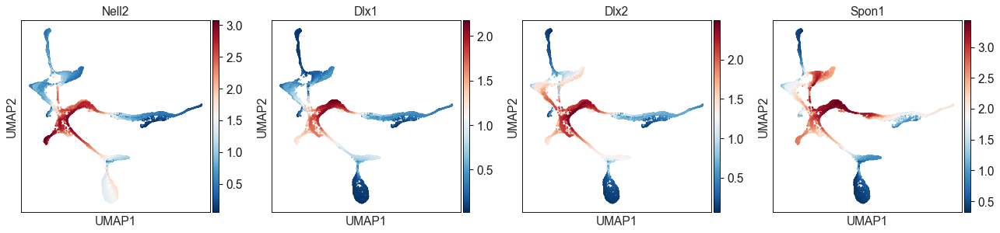

In [64]:
sc.pl.umap(adata,color=["Nell2","Dlx1","Dlx2","Spon1"],cmap="RdBu_r")
sc.pl.umap(adata,color=["Nell2","Dlx1","Dlx2","Spon1"],layer="magic",cmap="RdBu_r")

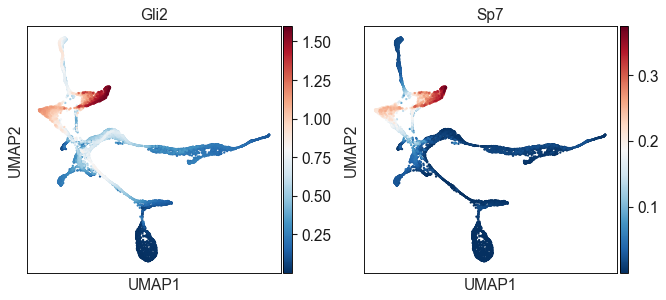

In [106]:
sc.pl.umap(adata,color=["Gli2",'Sp7'],layer="magic",cmap="RdBu_r")

In [98]:
adata_nohub=adata[adata.obs.Hub==False]
adata_noNCC=adata[adata.obs.NCC==False]
sc.tl.rank_genes_groups(adata_nohub,groupby="NCC",method="wilcoxon")
sc.tl.rank_genes_groups(adata_noNCC,groupby="Hub",method="wilcoxon")
df_noNCC=sc.get.rank_genes_groups_df(adata_noNCC,group="True",pval_cutoff=0.001)
df_nohub=sc.get.rank_genes_groups_df(adata_nohub,group="True",pval_cutoff=0.001)
df_noNCC=df_noNCC.loc[df_noNCC.scores>0]
df_nohub=df_nohub.loc[df_nohub.scores>0]

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


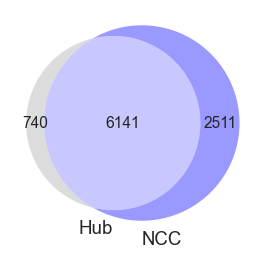

In [99]:
from matplotlib_venn import venn2

venn2([set(df_noNCC.names), set(df_nohub.names)],set_labels = ('Hub', 'NCC'),set_colors=('darkgrey', 'blue'))
plt.savefig('NCC_vs_Hub_venn_genes.svg')

In [67]:
adata_auc=sc.AnnData(auc,obs=adata.obs,obsm=adata.obsm)

In [68]:
adata_auc_nohub=adata_auc[adata_auc.obs.Hub==False]
adata_auc_noNCC=adata_auc[adata_auc.obs.NCC==False]
sc.tl.rank_genes_groups(adata_auc_nohub,groupby="NCC",method="wilcoxon")
sc.tl.rank_genes_groups(adata_auc_noNCC,groupby="Hub",method="wilcoxon")
df_noNCC=sc.get.rank_genes_groups_df(adata_auc_noNCC,group="True",pval_cutoff=0.001)
df_nohub=sc.get.rank_genes_groups_df(adata_auc_nohub,group="True",pval_cutoff=0.001)
df_noNCC=df_noNCC.loc[df_noNCC.scores>0]
df_nohub=df_nohub.loc[df_nohub.scores>0]

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


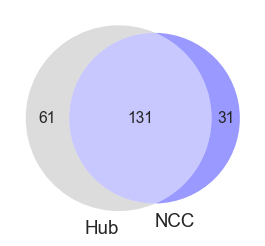

In [97]:
from matplotlib_venn import venn2

venn2([set(df_noNCC.names), set(df_nohub.names)],set_labels = ('Hub', 'NCC'),set_colors=('darkgrey', 'blue'))
plt.savefig('NCC_vs_Hub_venn_SCENIC.svg')

In [93]:
df=pd.concat([
    pd.DataFrame({'regulon':df_nohub[~df_nohub.names.isin(df_noNCC.names)].names,'specific':'NCC'}),
    pd.DataFrame({'regulon':df_noNCC[~df_noNCC.names.isin(df_nohub.names)].names,'specific':'Hub'}),
    pd.DataFrame({'regulon':df_nohub[df_nohub.names.isin(df_noNCC.names)].names,'specific':'common'})
]).reset_index(drop=True)

In [95]:
df.to_csv('Hub_vs_NCC_regulons.csv',index=False)

In [102]:
pd.set_option('display.max_rows', df.shape[0]+1)

In [45]:
adata.obs["Enteric_Adrenal"]=pd.DataFrame(adata[:,["Ret","Phox2b","Ascl1","Elavl3","Elavl4"]].X).mean(axis=1).values>2
adata.obs["Enteric_Adrenal"]=adata.obs["Enteric_Adrenal"].astype("category")

adata.obs["NCC_Glia"]=pd.DataFrame(adata[:,["Foxd3","Erbb2","Erbb3","Itga4","Postn","Sox2","L1cam"]].X).mean(axis=1).values>1.14
adata.obs["NCC_Glia"]=adata.obs["NCC_Glia"].astype("category")

/home/lfaure/miniconda3/envs/gpu/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


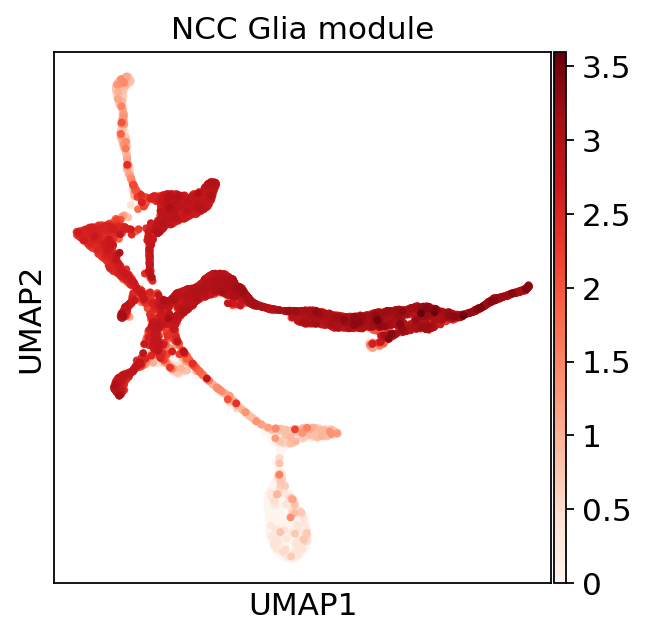

In [46]:
sc.set_figure_params(dpi_save=600,frameon=True)
combined_module=["Foxd3","Erbb2","Erbb3","Itga4","Postn","Sox2","L1cam",]
combined_module=["Sox9","Wnt1","Snai1","Ets1","Mpz","Plp1","Fbxo7","Gjc3","Pmp22","S100b"]
combined_module=["Sox10","Erbb3","Foxd3"]
adata.obs["NCC_Glia_module"]=pd.DataFrame(adata[:,combined_module].X).mean(axis=1).values
sc.pl.scatter(adata,basis="umap",color="NCC_Glia_module",color_map="Reds",size=50,legend_loc="none",save="NCC_glia_module.svg")

In [47]:
cors=list(map(lambda i: np.corrcoef(adata.X[:,i],adata.obs["NCC_Glia_module"].values)[0,1],
    range(len(adata.var_names))))

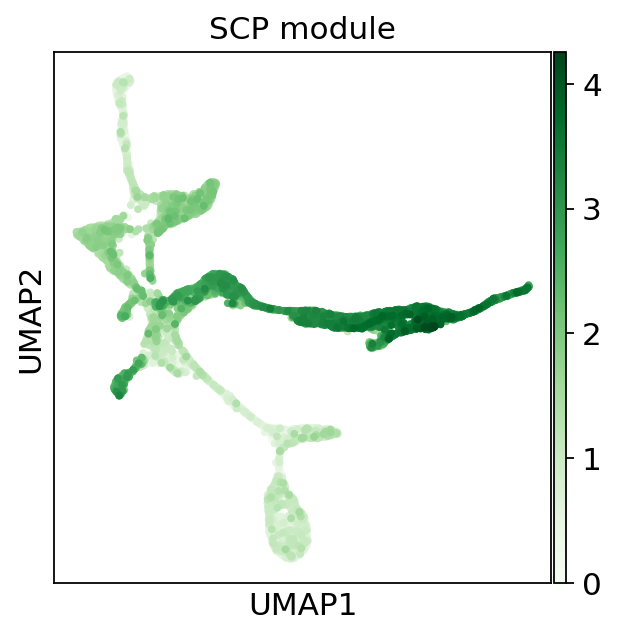

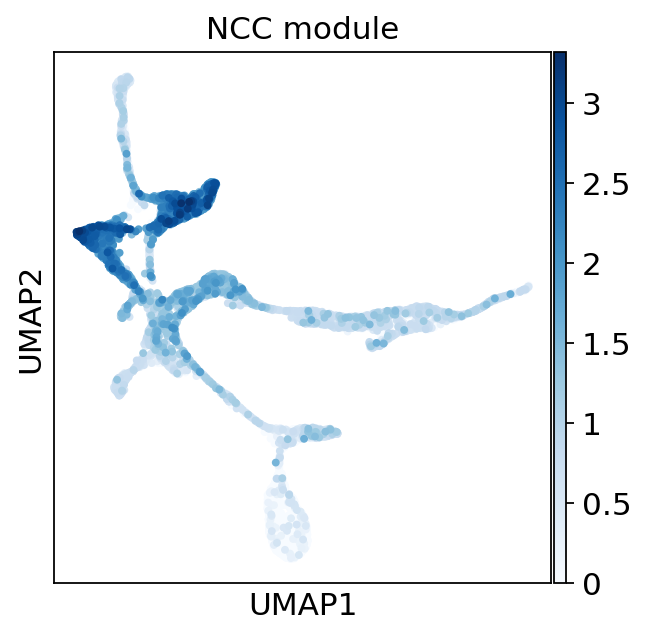

In [48]:
combined_module=["Mpz","Plp1","Fbxo7","Gjc3","Pmp22"]
adata.obs["SCP_module"]=pd.DataFrame(adata[:,combined_module].X).mean(axis=1).values
cors=list(map(lambda i: np.corrcoef(adata.X[:,i],adata.obs["SCP_module"].values)[0,1],
    range(len(adata.var_names))))
SCP_cor=pd.Series(cors,index=adata.var_names)

sc.pl.scatter(adata,basis="umap",color="SCP_module",color_map="Greens",size=50,legend_loc="none",save="_SCP_module.png")

combined_module=["Sox9","Wnt1","Snai1","Ets1"]
adata.obs["NCC_module"]=pd.DataFrame(adata[:,combined_module].X).mean(axis=1).values

sc.pl.scatter(adata,basis="umap",color="NCC_module",color_map="Blues",size=50,legend_loc="none",save="_NCC_module.png")

cors=list(map(lambda i: np.corrcoef(adata.X[:,i],adata.obs["NCC_module"].values)[0,1],
    range(len(adata.var_names))))
NCC_cor=pd.Series(cors,index=adata.var_names)

In [49]:
adata.var_names[((SCP_cor>.33) & (NCC_cor>.33)).values]

Index(['Fign', 'Itga6', 'Rcn1', 'Notch2', 'Lmo4', 'Foxd3', 'Pxn', 'Fkbp9',
       'Serpinh1', 'Rasa3', 'Oaf', 'Plp1', 'Utrn', 'Erbb3', 'Syde1', 'Dusp6',
       'Erbb2', 'Ngfr', 'Slc9a3r1', 'Zfp36l1', 'Nid2', 'Spata13', 'Ednrb',
       'Cdc42ep1', 'Sox10', 'Litaf', 'Hes1', 'Qk', 'Metrn', 'Ppic'],
      dtype='object')

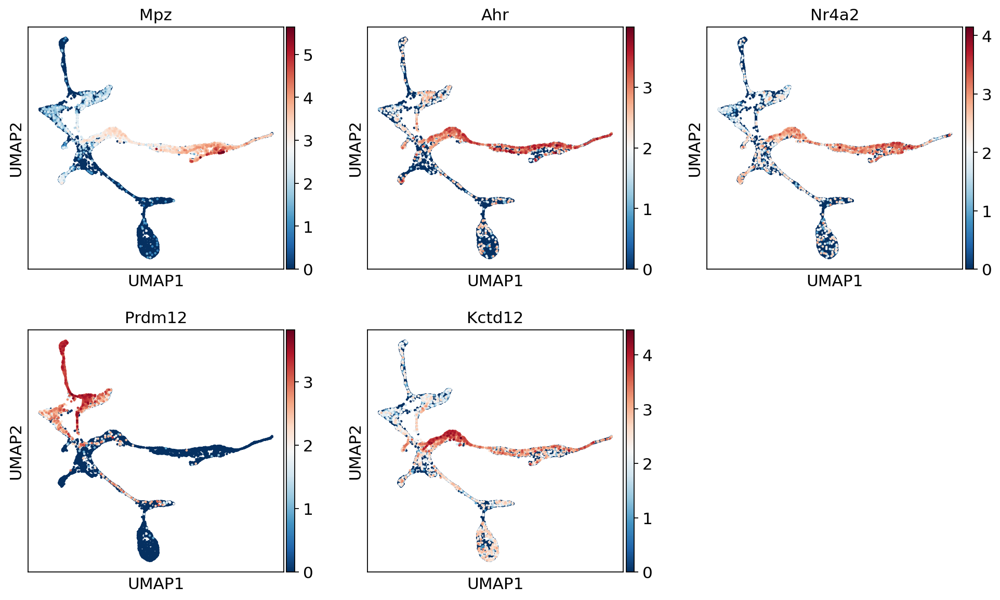

In [50]:
sc.pl.umap(adata,color=["Mpz","Ahr","Nr4a2","Prdm12","Kctd12"],color_map=gr,ncols=3)

In [51]:
for gene in adata.var_names[((SCP_cor>.33) & (NCC_cor>.33)).values]:
    #sc.pl.scatter(adata,basis="dUMAP",color=adata.var_names[np.array(cors)>.6][i:(i+3)],color_map="magma")#
    sc.pl.scatter(adata,basis="umap",color=gene, color_map=gr,save="_Glia_highcorr_"+gene+".svg",legend_loc="none",show=False)

In [52]:
adata.write("adata_fpm.h5ad")

In [62]:
import scvelo as scv
import pandas as pd
adata=scv.read("adata_velo.h5ad")
scv.set_figure_params("scvelo",figsize=(6,6))
adata.obsm["X_umap"]=adata.obsm["X_diff"]
adata.obs["CytoTRACE"]=pd.read_table("megaCytoTRACE_plot_table.txt")["CytoTRACE"][adata.obs_names].values
scv.pl.velocity_embedding_stream(adata, basis='umap',color="CytoTRACE",cmap="Spectral_r",colorbar=False,
                                 save="_CytoTRACE.png",dpi=600)

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


saving figure to file ./figures/scvelo__CytoTRACE.png


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo__CytoTRACE_genebased.png


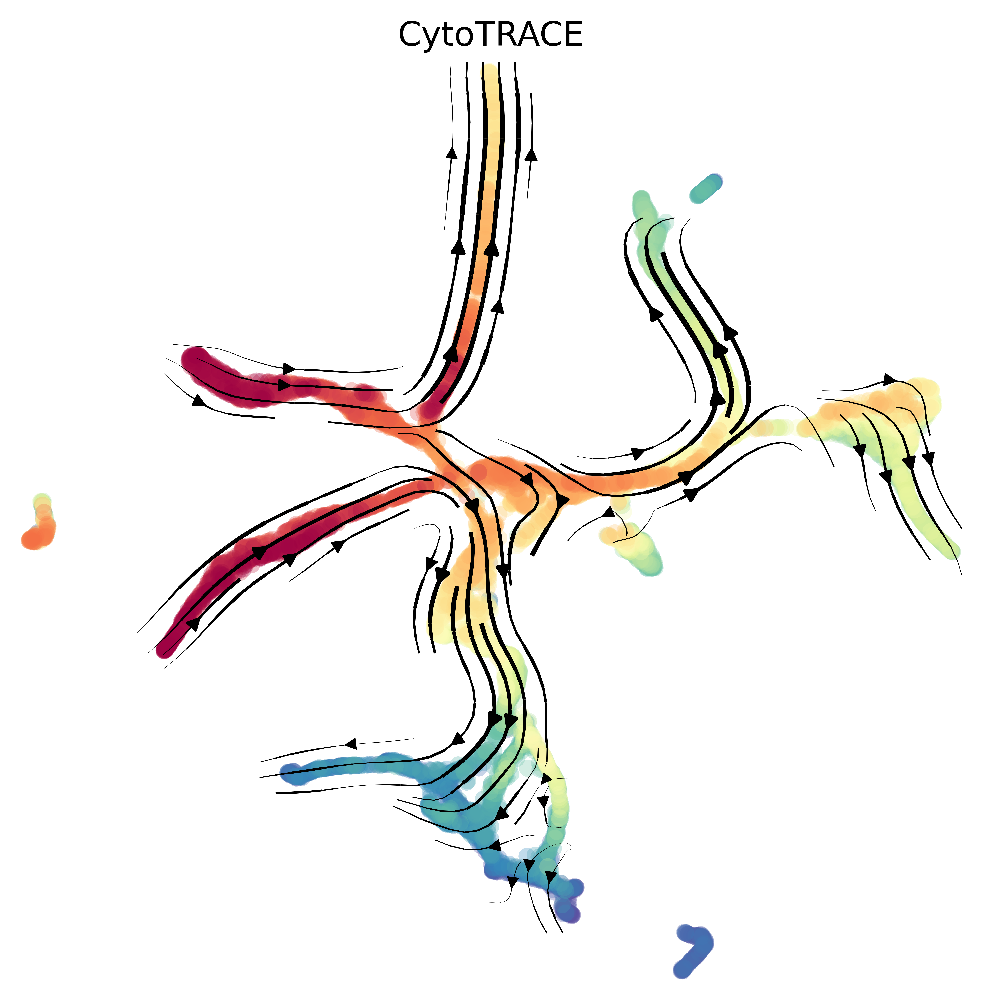

In [2]:
import scvelo as scv
import pandas as pd
adata=scv.read("adata_velo.h5ad")
scv.set_figure_params("scvelo",figsize=(6,6))
adata.obsm["X_umap"]=pd.read_csv("UMAP_Glia_mega.csv",index_col=0).values
adata.obs["CytoTRACE"]=pd.read_table("megaCytoTRACE_plot_table.txt")["CytoTRACE"][adata.obs_names].values
scv.pl.velocity_embedding_stream(adata, basis='umap',color="CytoTRACE",cmap="Spectral_r",colorbar=False,
                                 save="_CytoTRACE_genebased.png",dpi=600)

In [4]:
import scanpy as sc
adata_fpm=sc.read('adata_fpm.h5ad')
adata.obs=adata_fpm.obs
adata.uns=adata_fpm.uns
sc.pl.umap(adata,color="devtime",size=50,palette=col_devtime,save="devtime.png",add_outline=True)

NameError: name 'col_devtime' is not defined

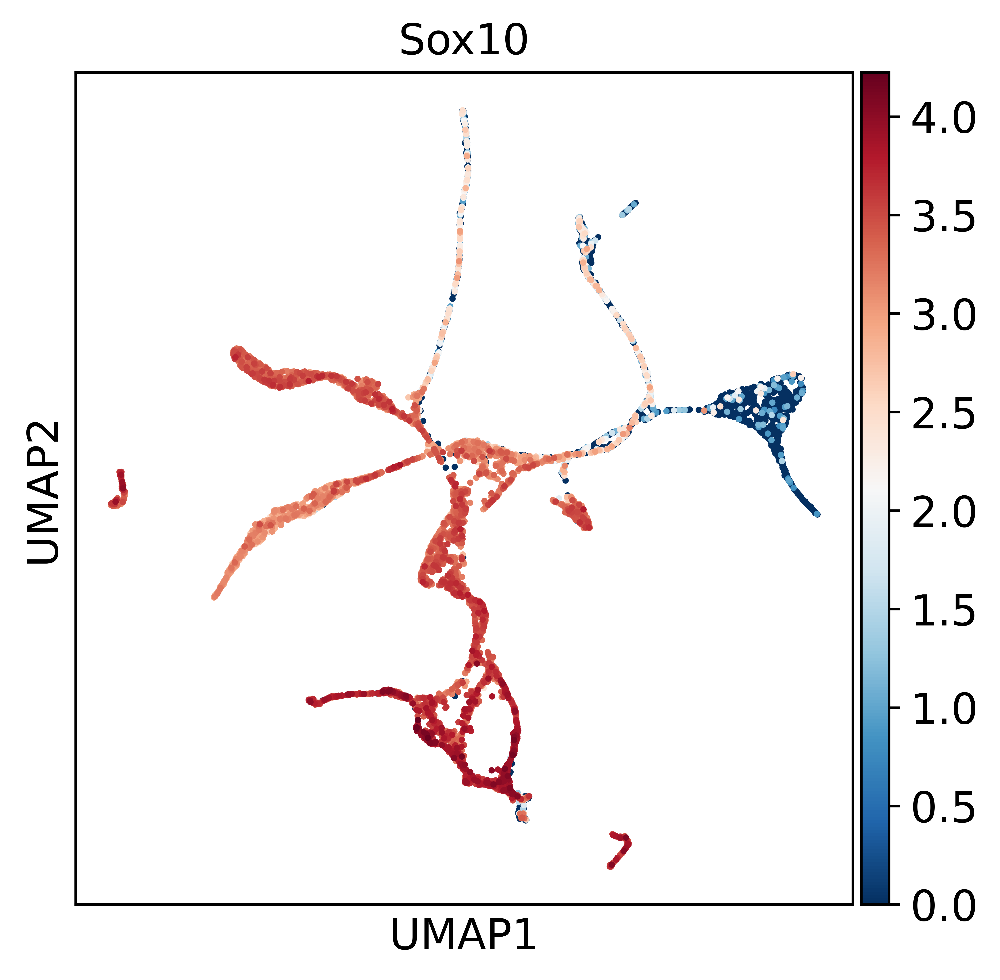

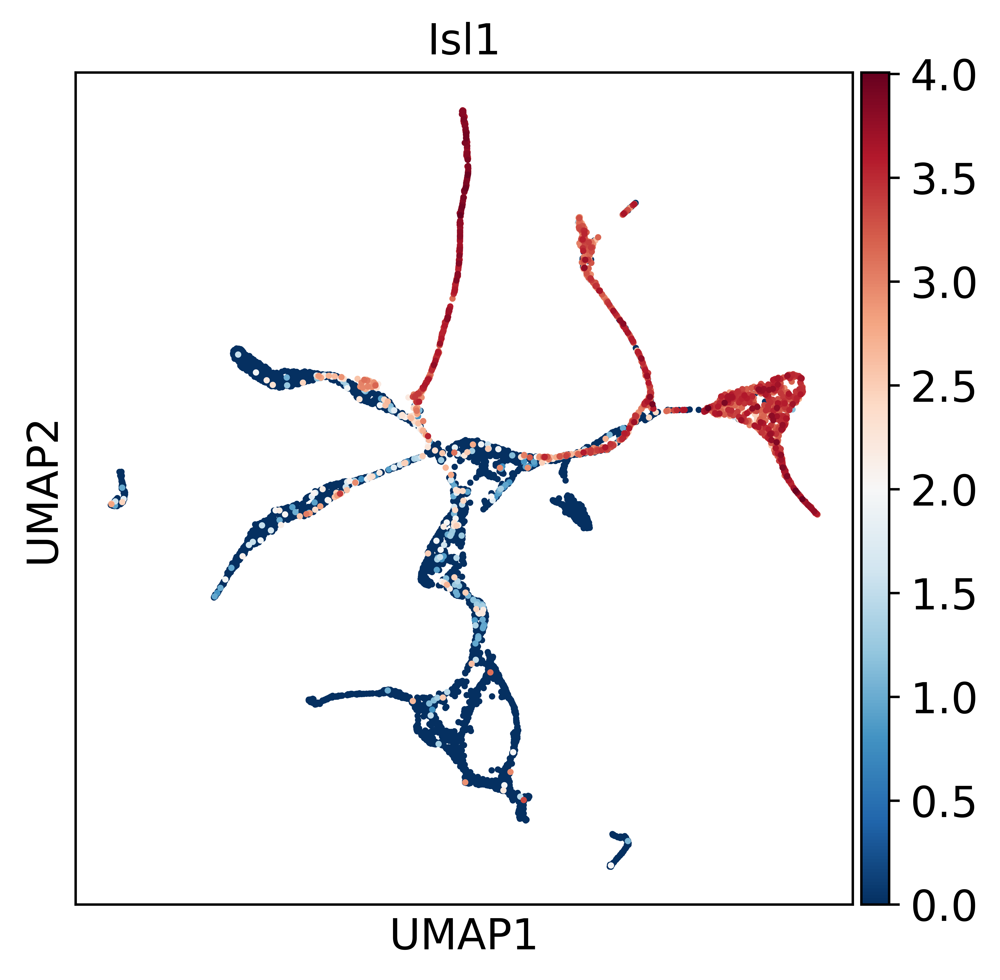

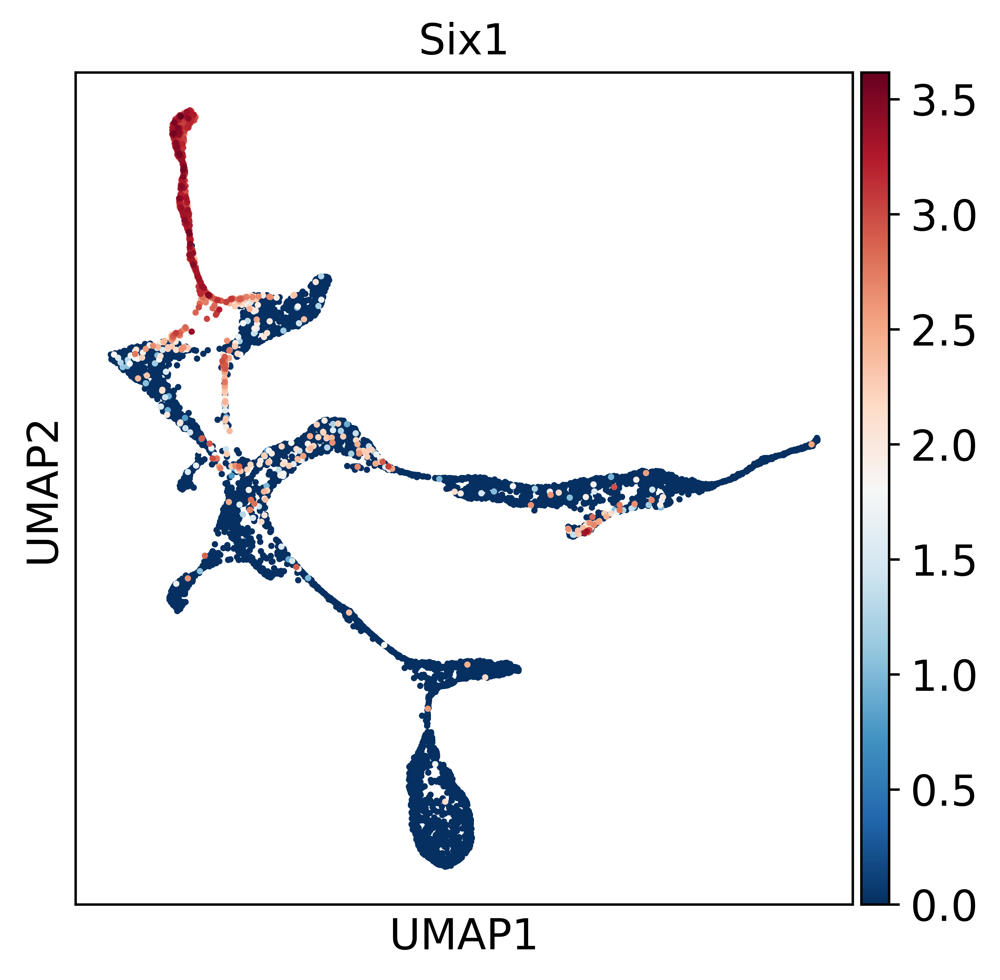

In [10]:
sc.set_figure_params(figsize=(5,5),dpi=600)
adata_fpm.obsm["X_umap"]=pd.read_csv("UMAP_Glia_mega.csv",index_col=0).values
sc.pl.umap(adata_fpm,color='Sox10')
sc.pl.umap(adata_fpm,color='Isl1')
adata_fpm=sc.read('adata_fpm.h5ad')
sc.pl.umap(adata_fpm,color='Six1',)